In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
from factor_analyzer import FactorAnalyzer

In [2]:
df=pd.read_csv('Education+-+Post+12th+Standard.csv')

### <U>  2.1 Perform Exploratory Data Analysis [both univariate and multivariate analysis to be performed]. What insight do you draw from the EDA?

#### EDA for the Dataset
##### explore the data and per the analysis
    - Check the Data (Anomalies,duplicates, NaN values, outliers, )
    - Treat for Bad Data and Outliers
    - Analyse the data type and Skewness of the Data

In [3]:
df.head(5)

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,1660,1232,721,23,52,2885,537,7440,3300,450,2200,70,78,18.1,12,7041,60
1,Adelphi University,2186,1924,512,16,29,2683,1227,12280,6450,750,1500,29,30,12.2,16,10527,56
2,Adrian College,1428,1097,336,22,50,1036,99,11250,3750,400,1165,53,66,12.9,30,8735,54
3,Agnes Scott College,417,349,137,60,89,510,63,12960,5450,450,875,92,97,7.7,37,19016,59
4,Alaska Pacific University,193,146,55,16,44,249,869,7560,4120,800,1500,76,72,11.9,2,10922,15


In [4]:
df.shape

(777, 18)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 777 entries, 0 to 776
Data columns (total 18 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Names        777 non-null    object 
 1   Apps         777 non-null    int64  
 2   Accept       777 non-null    int64  
 3   Enroll       777 non-null    int64  
 4   Top10perc    777 non-null    int64  
 5   Top25perc    777 non-null    int64  
 6   F.Undergrad  777 non-null    int64  
 7   P.Undergrad  777 non-null    int64  
 8   Outstate     777 non-null    int64  
 9   Room.Board   777 non-null    int64  
 10  Books        777 non-null    int64  
 11  Personal     777 non-null    int64  
 12  PhD          777 non-null    int64  
 13  Terminal     777 non-null    int64  
 14  S.F.Ratio    777 non-null    float64
 15  perc.alumni  777 non-null    int64  
 16  Expend       777 non-null    int64  
 17  Grad.Rate    777 non-null    int64  
dtypes: float64(1), int64(16), object(1)
memory usage: 

In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Apps,777.0,3001.638353,3870.201484,81.0,776.0,1558.0,3624.0,48094.0
Accept,777.0,2018.804376,2451.113971,72.0,604.0,1110.0,2424.0,26330.0
Enroll,777.0,779.972973,929.176190,35.0,242.0,434.0,902.0,6392.0
Top10perc,777.0,27.558559,17.640364,1.0,15.0,23.0,35.0,96.0
Top25perc,777.0,55.796654,19.804778,9.0,41.0,54.0,69.0,100.0
F.Undergrad,777.0,3699.907336,4850.420531,139.0,992.0,1707.0,4005.0,31643.0
P.Undergrad,777.0,855.298584,1522.431887,1.0,95.0,353.0,967.0,21836.0
Outstate,777.0,10440.669241,4023.016484,2340.0,7320.0,9990.0,12925.0,21700.0
Room.Board,777.0,4357.526384,1096.696416,1780.0,3597.0,4200.0,5050.0,8124.0
Books,777.0,549.380952,165.105360,96.0,470.0,500.0,600.0,2340.0


In [7]:
percalumni_filtered = df[df['perc.alumni']==0]
print (percalumni_filtered)

                               Names  Apps  Accept  Enroll  Top10perc  \
104    Central Washington University  2785    2011    1007          8   
678  University of Southern Colorado  1401    1239     605         10   

     Top25perc  F.Undergrad  P.Undergrad  Outstate  Room.Board  Books  \
104         65         6507          898      7242        3603    654   
678         34         3716          675      7100        4380    540   

     Personal  PhD  Terminal  S.F.Ratio  perc.alumni  Expend  Grad.Rate  
104      1416   67        89       18.1            0    6413         51  
678      2948   63        88       19.4            0    5389         36  


In [8]:
dup= df.duplicated()
df[dup]

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate


In [9]:
df.isnull().sum()

Names          0
Apps           0
Accept         0
Enroll         0
Top10perc      0
Top25perc      0
F.Undergrad    0
P.Undergrad    0
Outstate       0
Room.Board     0
Books          0
Personal       0
PhD            0
Terminal       0
S.F.Ratio      0
perc.alumni    0
Expend         0
Grad.Rate      0
dtype: int64

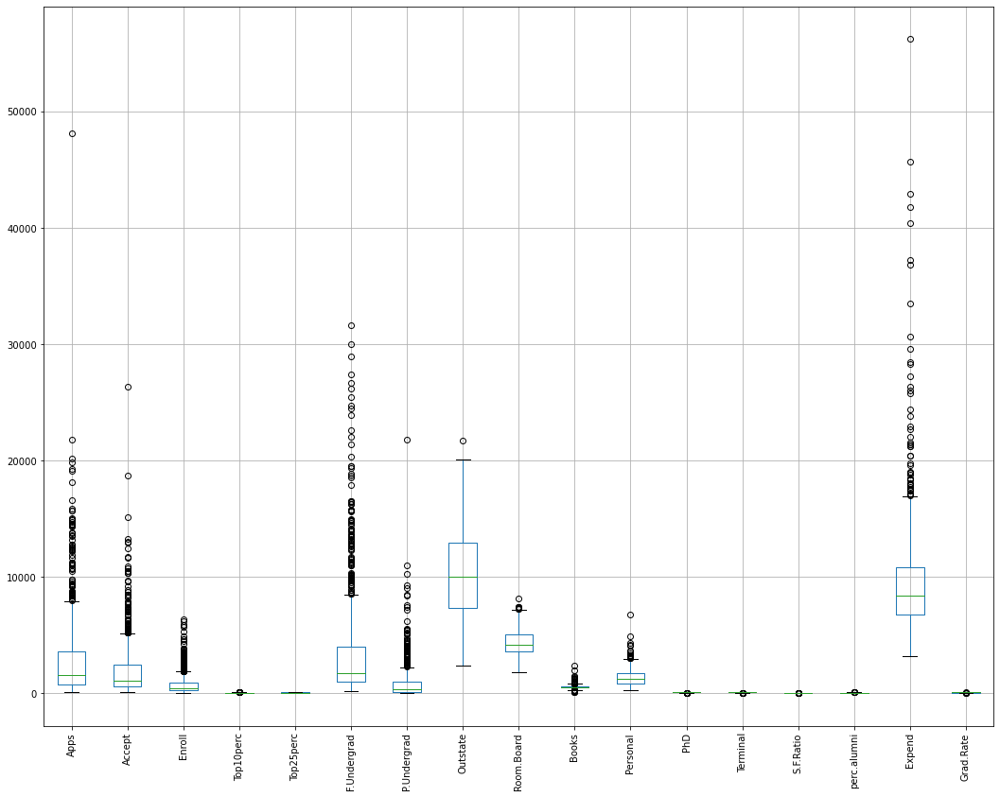

In [10]:
plt.figure(figsize=(18,14))
df.boxplot();
plt.xticks(rotation=90);

In [11]:
admission = ['Apps','Accept','Enroll']
school= ['Top10perc','Top25perc']
grad= ['F.Undergrad', 'P.Undergrad']
expense =['Room.Board','Books','Personal']
faculty= ['PhD', 'Terminal','S.F.Ratio']

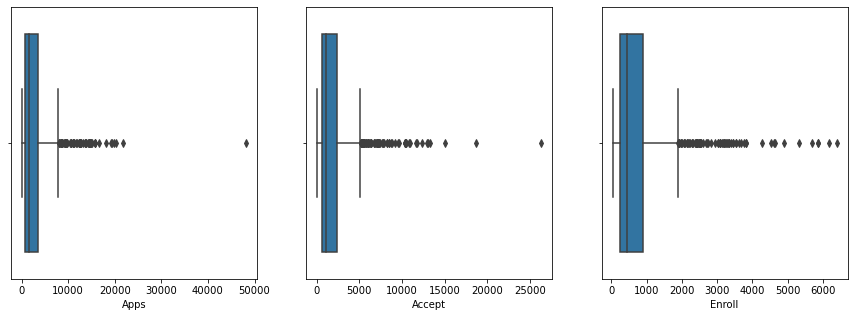

In [12]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.boxplot(df[admission[i]])



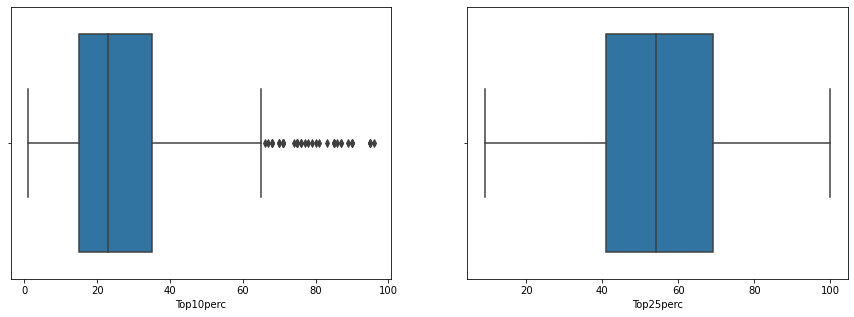

In [13]:
plt.figure(figsize=(15,5))
for i in range (0,2):
    plt.subplot(1,2,i+1)
    sns.boxplot(df[school[i]])

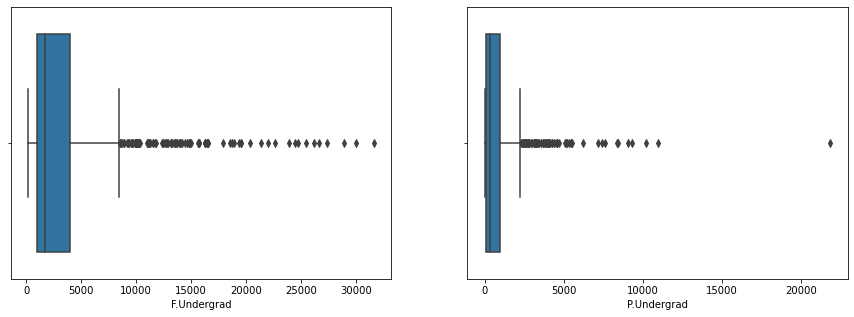

In [14]:
plt.figure(figsize=(15,5))
for i in range (0,2):
    plt.subplot(1,2,i+1)
    sns.boxplot(df[grad[i]])

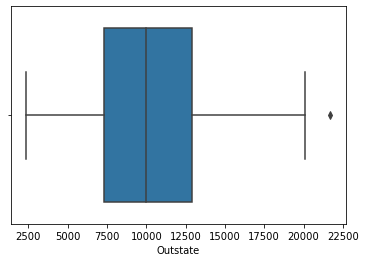

In [15]:
sns.boxplot(df['Outstate'])

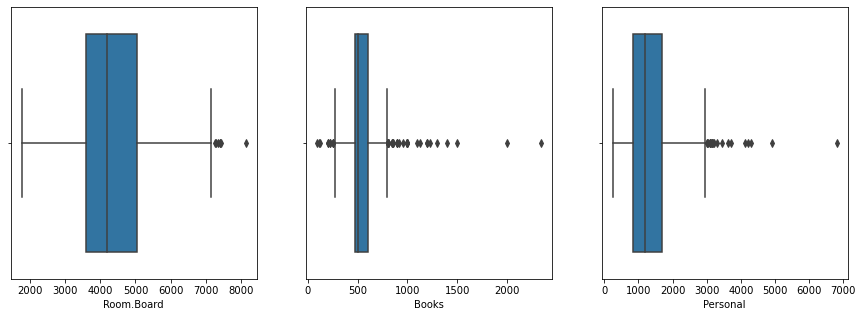

In [16]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.boxplot(df[expense[i]])

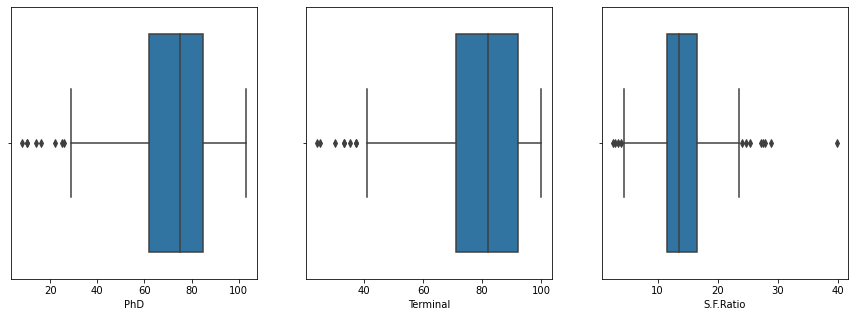

In [17]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.boxplot(df[faculty[i]])

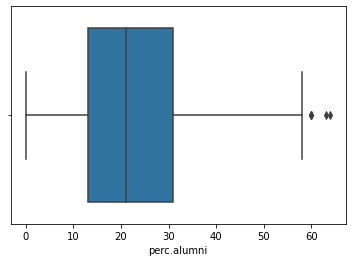

In [18]:
sns.boxplot(df['perc.alumni']);

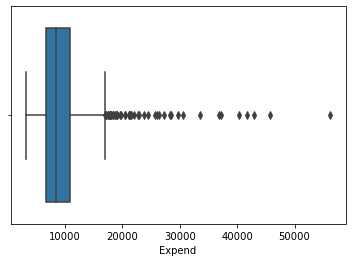

In [19]:
sns.boxplot(df['Expend']);

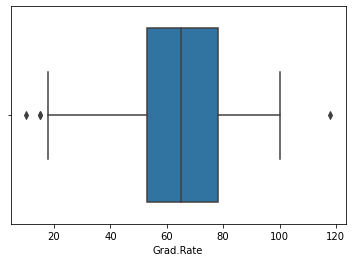

In [20]:
sns.boxplot(df['Grad.Rate']);

##### <u> Observations
    
    1. Overall the Data looks good (no anomalies)
    2. There are 18 variables and 777 values to each variable (no NaN / Null values)
    3. perc.alumni has '0' as value for 2 universities (Central Washington University,University of Southern Colorado). Since there are no outliers in this variable we neednot replace the 0 values to mean.
    4. There are different kinds of variables percentages, ratios, discreet and continuous values
    5. All the numberical variables have outliers except Top25perc which needs to be treated

###### <u> Outlier Treatment<u>

In [21]:
def remove_outlier(col):
    Q1,Q3= col.quantile([0.25,0.75])
    IQR=Q3-Q1
    lower_range = Q1-(1.5*IQR)
    upper_range= Q3+(1.5*IQR)
    return lower_range, upper_range
    


In [22]:
list_num= ['Apps','Accept','Enroll','Top10perc','Top25perc','F.Undergrad','P.Undergrad','Outstate','Room.Board','Books','Personal','PhD','Terminal','S.F.Ratio','perc.alumni','Expend','Grad.Rate']
for i in list_num:
    LL,UL = remove_outlier(df[i])
    df[i]= np.where(df[i]> UL, UL ,df[i])
    df[i]= np.where (df[i]< LL, LL,df[i])

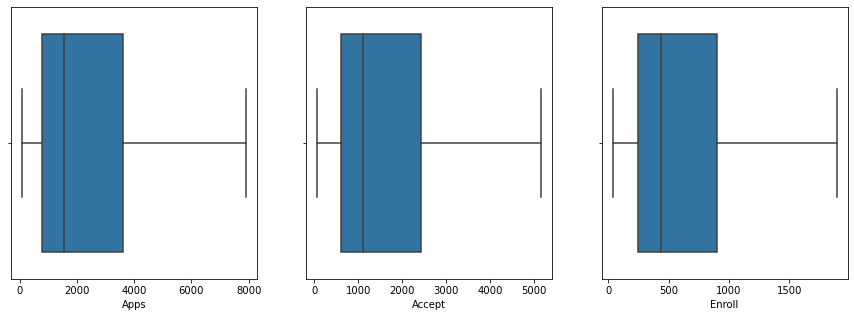

In [23]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.boxplot(df[admission[i]])

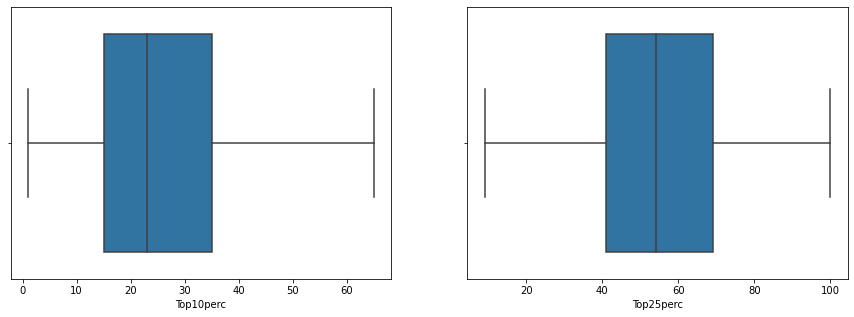

In [24]:
plt.figure(figsize=(15,5))
for i in range (0,2):
    plt.subplot(1,2,i+1)
    sns.boxplot(df[school[i]])

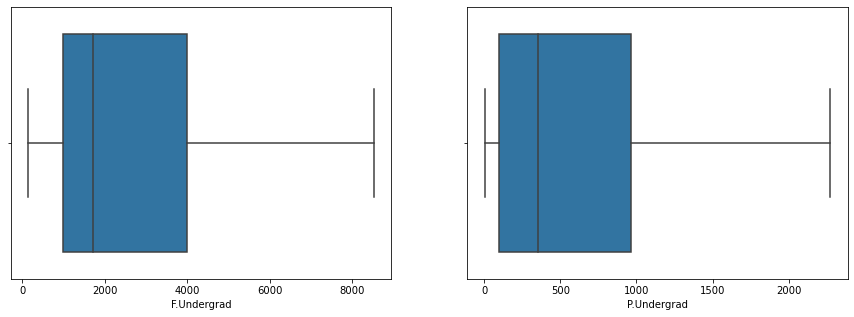

In [25]:
plt.figure(figsize=(15,5))
for i in range (0,2):
    plt.subplot(1,2,i+1)
    sns.boxplot(df[grad[i]])

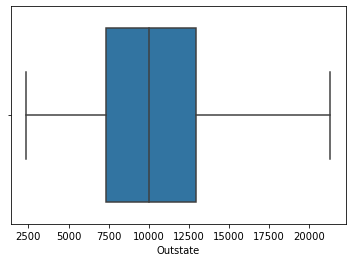

In [26]:
sns.boxplot(df['Outstate'])

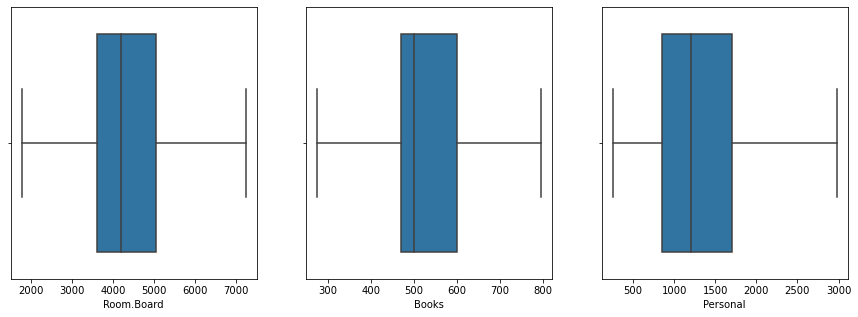

In [27]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.boxplot(df[expense[i]])

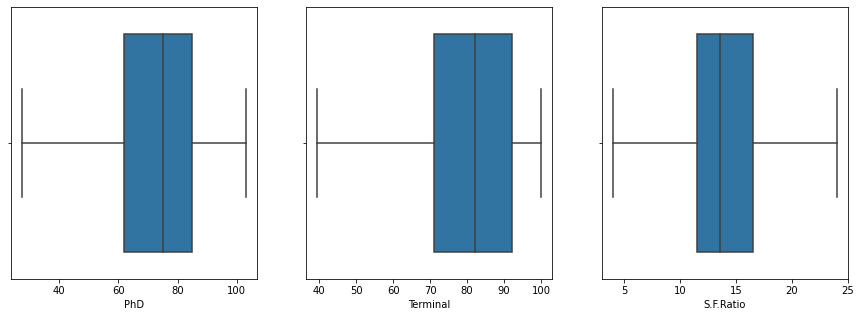

In [28]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.boxplot(df[faculty[i]])

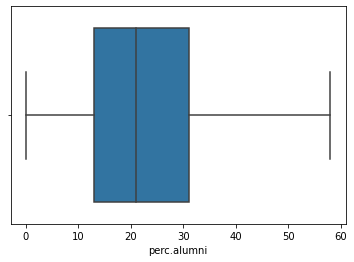

In [29]:
sns.boxplot(df['perc.alumni']);

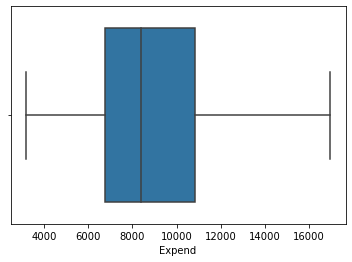

In [30]:
sns.boxplot(df['Expend']);

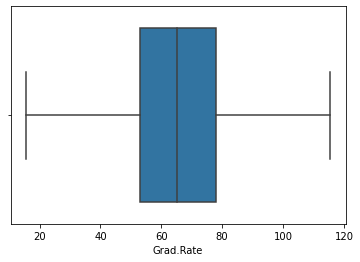

In [31]:
sns.boxplot(df['Grad.Rate']);

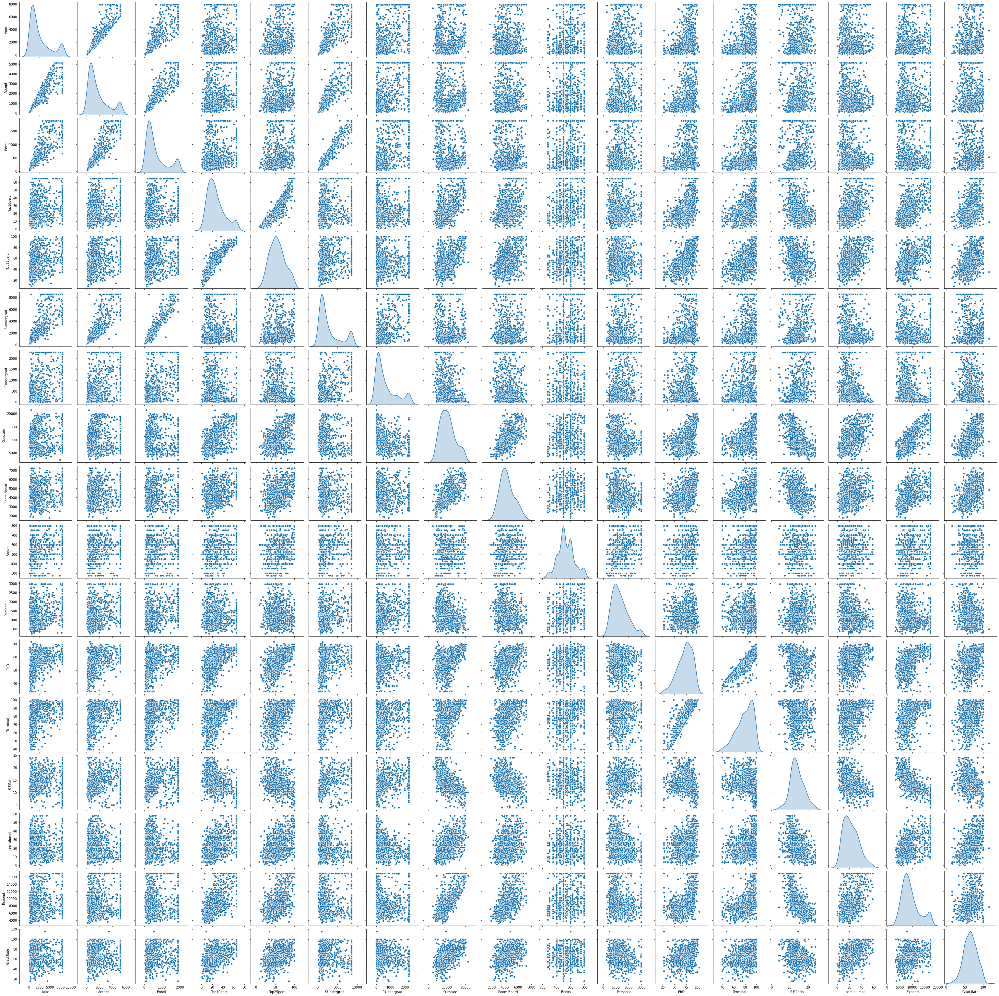

In [32]:
sns.pairplot(df, diag_kind='kde')
plt.show()

In [33]:
df.corr()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.000000,0.955307,0.896883,0.321342,0.364491,0.861002,0.519823,0.065337,0.187475,0.236138,0.229948,0.463924,0.434478,0.126411,-0.101158,0.242935,0.150803
Accept,0.955307,1.000000,0.935277,0.223298,0.273681,0.897034,0.572691,-0.005002,0.119586,0.208705,0.256346,0.427341,0.403409,0.188506,-0.165516,0.161808,0.078982
Enroll,0.896883,0.935277,1.000000,0.171756,0.230434,0.967302,0.641595,-0.155655,-0.023846,0.202057,0.339348,0.381540,0.354379,0.274269,-0.222723,0.054221,-0.023251
Top10perc,0.321342,0.223298,0.171756,1.000000,0.913875,0.111215,-0.180009,0.562160,0.357366,0.153452,-0.116730,0.544048,0.506748,-0.387926,0.455797,0.657039,0.493670
Top25perc,0.364491,0.273681,0.230434,0.913875,1.000000,0.181196,-0.099295,0.489569,0.330987,0.169761,-0.086810,0.551461,0.527654,-0.297233,0.416832,0.572905,0.478985
F.Undergrad,0.861002,0.897034,0.967302,0.111215,0.181196,1.000000,0.696130,-0.226166,-0.054476,0.207879,0.359783,0.361564,0.335054,0.324504,-0.285457,0.000371,-0.082239
P.Undergrad,0.519823,0.572691,0.641595,-0.180009,-0.099295,0.696130,1.000000,-0.354216,-0.067638,0.122529,0.344053,0.127663,0.122152,0.370607,-0.419334,-0.201929,-0.265158
Outstate,0.065337,-0.005002,-0.155655,0.562160,0.489569,-0.226166,-0.354216,1.000000,0.655489,0.005110,-0.325609,0.391321,0.412579,-0.573683,0.565736,0.775328,0.572458
Room.Board,0.187475,0.119586,-0.023846,0.357366,0.330987,-0.054476,-0.067638,0.655489,1.000000,0.108924,-0.219554,0.341469,0.379270,-0.376430,0.272393,0.580622,0.425790
Books,0.236138,0.208705,0.202057,0.153452,0.169761,0.207879,0.122529,0.005110,0.108924,1.000000,0.239863,0.136390,0.159318,-0.008536,-0.042832,0.149983,-0.008051


###### All the outliers were treated now and the data is ready for further analysis
     1. Some correlation amongst the group 
     2. Strong Correlation Apps, Acceptance, F.Undergrad, P.Undergrad,PhD and Terminal .

###### <u> 2.2 Is scaling necessary for PCA in this case? Give justification and perform scaling.

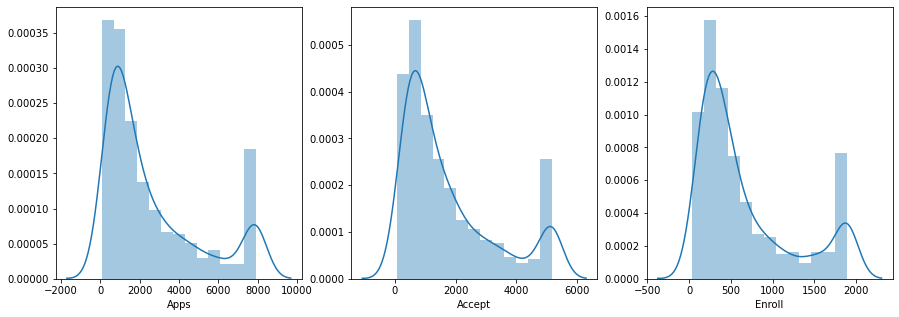

In [34]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.distplot(df[admission[i]])

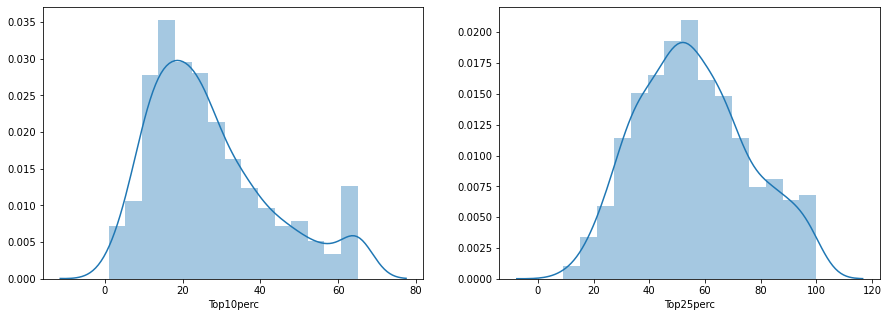

In [35]:
plt.figure(figsize=(15,5))
for i in range (0,2):
    plt.subplot(1,2,i+1)
    sns.distplot(df[school[i]])

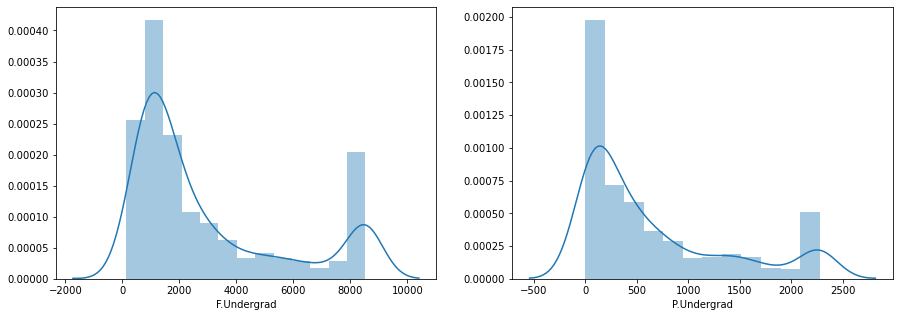

In [36]:
plt.figure(figsize=(15,5))
for i in range (0,2):
    plt.subplot(1,2,i+1)
    sns.distplot(df[grad[i]])

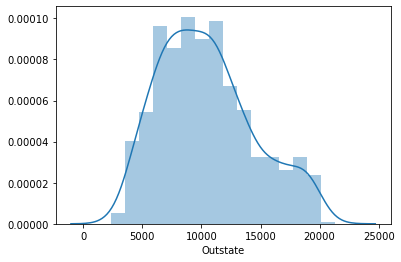

In [37]:
sns.distplot(df['Outstate'])

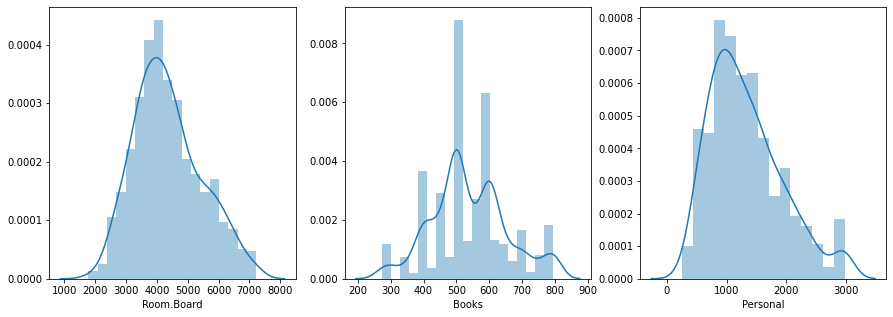

In [38]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.distplot(df[expense[i]])

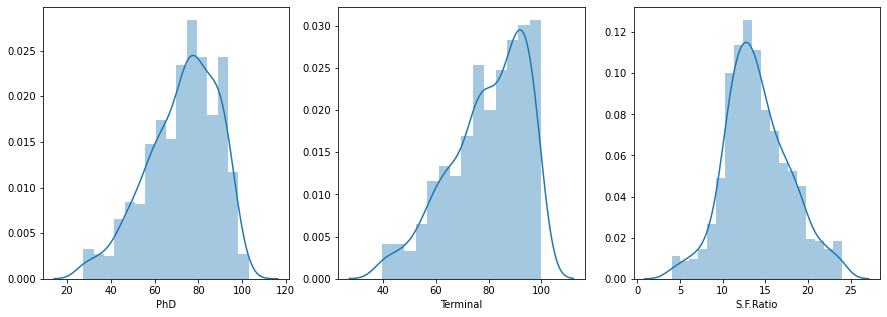

In [39]:
plt.figure(figsize=(15,5))
for i in range (0,3):
    plt.subplot(1,3,i+1)
    sns.distplot(df[faculty[i]])

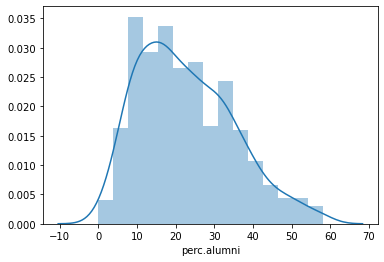

In [40]:
sns.distplot(df['perc.alumni']);

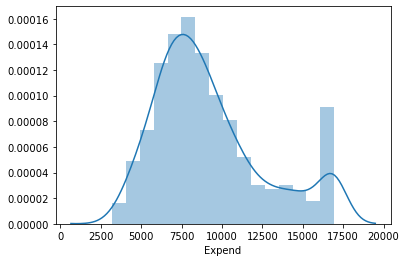

In [41]:
sns.distplot(df['Expend']);

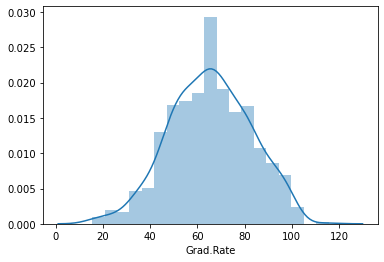

In [42]:
sns.distplot(df['Grad.Rate']);

###### From the above we can confirm that we would need scaling for :
      1. Some of the variables are rightly skewed
      2. Some of the variables are left skewed
      3. Some are equally distributed
      4. Although the numerical variables are continuous they represent a percentages, ratios and counts

In [43]:
from sklearn.preprocessing import StandardScaler
std_scale=StandardScaler()
std_scale


StandardScaler()

In [44]:
scale= StandardScaler()
df1=pd.DataFrame(scale.fit_transform(df[list_num]), columns = list_num)
df1.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,-0.376493,-0.337830,0.106380,-0.246780,-0.191827,-0.018769,-0.166083,-0.746480,-0.968324,-0.776567,1.438500,-0.174045,-0.123239,1.070602,-0.870466,-0.630916,-0.319205
1,-0.159195,0.116744,-0.260441,-0.696290,-1.353911,-0.093626,0.797856,0.457762,1.921680,1.828605,0.289289,-2.745731,-2.785068,-0.489511,-0.545726,0.396097,-0.552693
2,-0.472336,-0.426511,-0.569343,-0.310996,-0.292878,-0.703966,-0.777974,0.201488,-0.555466,-1.210762,-0.260691,-1.240354,-0.952900,-0.304413,0.590864,-0.131845,-0.669437
3,-0.889994,-0.917871,-0.918613,2.129202,1.677612,-0.898889,-0.828267,0.626954,1.004218,-0.776567,-0.736792,1.205884,1.190391,-1.679429,1.159159,2.287940,-0.377577
4,-0.982532,-1.051221,-1.062533,-0.696290,-0.596031,-0.995610,0.297726,-0.716623,-0.216006,2.219381,0.289289,0.202299,-0.538069,-0.568839,-1.682316,0.512468,-2.916759


In [45]:
from scipy.stats import zscore

In [46]:
df[list_num].apply(zscore).head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,-0.376493,-0.337830,0.106380,-0.246780,-0.191827,-0.018769,-0.166083,-0.746480,-0.968324,-0.776567,1.438500,-0.174045,-0.123239,1.070602,-0.870466,-0.630916,-0.319205
1,-0.159195,0.116744,-0.260441,-0.696290,-1.353911,-0.093626,0.797856,0.457762,1.921680,1.828605,0.289289,-2.745731,-2.785068,-0.489511,-0.545726,0.396097,-0.552693
2,-0.472336,-0.426511,-0.569343,-0.310996,-0.292878,-0.703966,-0.777974,0.201488,-0.555466,-1.210762,-0.260691,-1.240354,-0.952900,-0.304413,0.590864,-0.131845,-0.669437
3,-0.889994,-0.917871,-0.918613,2.129202,1.677612,-0.898889,-0.828267,0.626954,1.004218,-0.776567,-0.736792,1.205884,1.190391,-1.679429,1.159159,2.287940,-0.377577
4,-0.982532,-1.051221,-1.062533,-0.696290,-0.596031,-0.995610,0.297726,-0.716623,-0.216006,2.219381,0.289289,0.202299,-0.538069,-0.568839,-1.682316,0.512468,-2.916759


###### Applied both the libraries to do the scaling of the data.

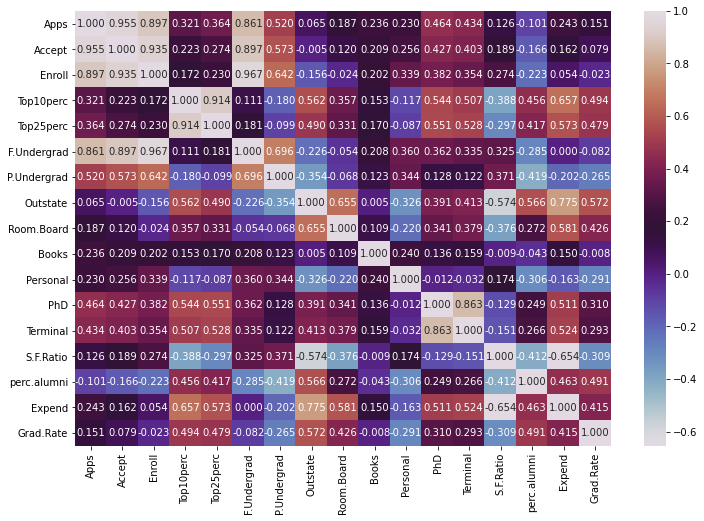

In [47]:
plt.figure(figsize= (12,8))
sns.heatmap(df.corr(), annot= True, fmt='.3f', cmap= 'twilight')
plt.show()

##### <u> 2.3 Comment on the comparison between the covariance and the correlation matrices from this data.



 1. Some correlation amongst the group 
 2. Strong Correlation in Apps, Acceptance, F.Undergrad, P.Undergrad,PhD and Terminal .

##### <u> 2.4 Check the dataset for outliers before and after scaling. What insight do you derive here?

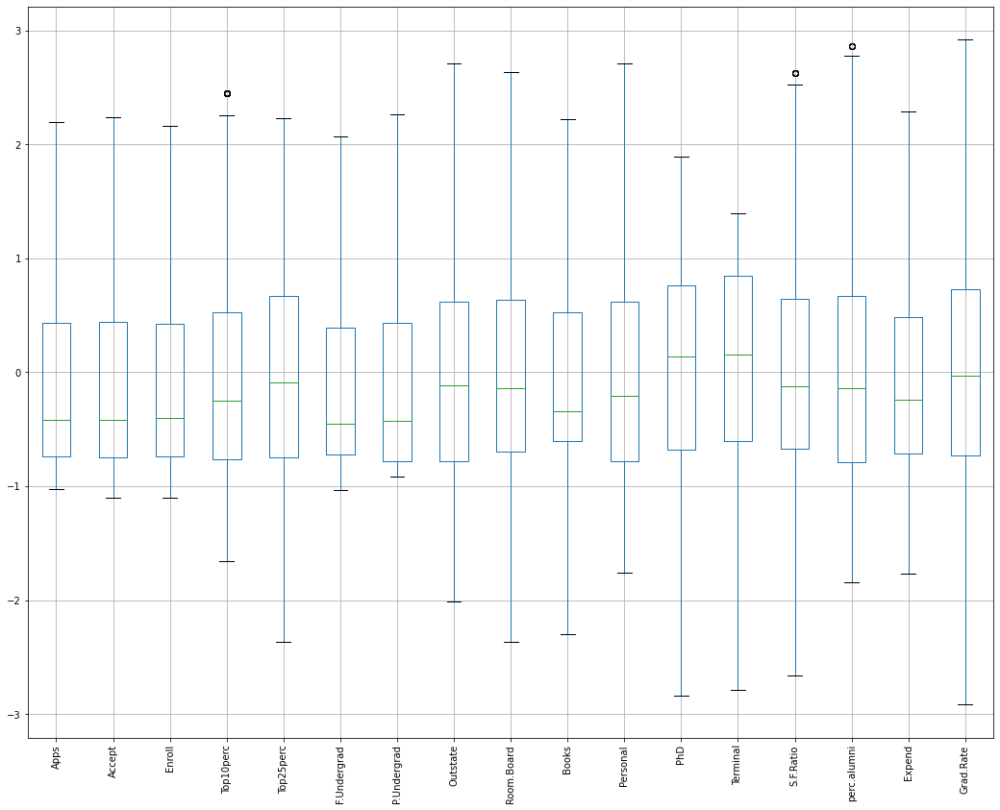

In [48]:
plt.figure(figsize=(18,14))
df1.boxplot();
plt.xticks(rotation=90);

###### <u> Observation on outliers post scaling
           
          - Median for all the variables are more central
          - few outliers show up for the near values, these are values as exceptions.
          - Data on a single scale clearly improves the skewness of the data

###### <u> 2.5 Perform PCA and export the data of the Principal Component scores into a data frame.

In [49]:
df.head(6)

,Names,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,Abilene Christian University,1660.0,1232.0,721.0,23.0,52.0,2885.0,537.0,7440.0,3300.0,450.0,2200.0,70.0,78.0,18.1,12.0,7041.0,60.0
1,Adelphi University,2186.0,1924.0,512.0,16.0,29.0,2683.0,1227.0,12280.0,6450.0,750.0,1500.0,29.0,39.5,12.2,16.0,10527.0,56.0
2,Adrian College,1428.0,1097.0,336.0,22.0,50.0,1036.0,99.0,11250.0,3750.0,400.0,1165.0,53.0,66.0,12.9,30.0,8735.0,54.0
3,Agnes Scott College,417.0,349.0,137.0,60.0,89.0,510.0,63.0,12960.0,5450.0,450.0,875.0,92.0,97.0,7.7,37.0,16948.5,59.0
4,Alaska Pacific University,193.0,146.0,55.0,16.0,44.0,249.0,869.0,7560.0,4120.0,795.0,1500.0,76.0,72.0,11.9,2.0,10922.0,15.5
5,Albertson College,587.0,479.0,158.0,38.0,62.0,678.0,41.0,13500.0,3335.0,500.0,675.0,67.0,73.0,9.4,11.0,9727.0,55.0


In [50]:
df1.head()

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
0,-0.376493,-0.337830,0.106380,-0.246780,-0.191827,-0.018769,-0.166083,-0.746480,-0.968324,-0.776567,1.438500,-0.174045,-0.123239,1.070602,-0.870466,-0.630916,-0.319205
1,-0.159195,0.116744,-0.260441,-0.696290,-1.353911,-0.093626,0.797856,0.457762,1.921680,1.828605,0.289289,-2.745731,-2.785068,-0.489511,-0.545726,0.396097,-0.552693
2,-0.472336,-0.426511,-0.569343,-0.310996,-0.292878,-0.703966,-0.777974,0.201488,-0.555466,-1.210762,-0.260691,-1.240354,-0.952900,-0.304413,0.590864,-0.131845,-0.669437
3,-0.889994,-0.917871,-0.918613,2.129202,1.677612,-0.898889,-0.828267,0.626954,1.004218,-0.776567,-0.736792,1.205884,1.190391,-1.679429,1.159159,2.287940,-0.377577
4,-0.982532,-1.051221,-1.062533,-0.696290,-0.596031,-0.995610,0.297726,-0.716623,-0.216006,2.219381,0.289289,0.202299,-0.538069,-0.568839,-1.682316,0.512468,-2.916759


<h6> Performing the bartlett test to confirm that the value of the of- diagnoll elements of the covariance are non-zero <h6>

In [70]:
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value, p_value = calculate_bartlett_sphericity (df1)
p_value

0.0

In [51]:
cov_matrix= np.round(df1.cov(),2).T
cov_matrix

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.00,0.96,0.90,0.32,0.36,0.86,0.52,0.07,0.19,0.24,0.23,0.46,0.44,0.13,-0.10,0.24,0.15
Accept,0.96,1.00,0.94,0.22,0.27,0.90,0.57,-0.01,0.12,0.21,0.26,0.43,0.40,0.19,-0.17,0.16,0.08
Enroll,0.90,0.94,1.00,0.17,0.23,0.97,0.64,-0.16,-0.02,0.20,0.34,0.38,0.35,0.27,-0.22,0.05,-0.02
Top10perc,0.32,0.22,0.17,1.00,0.92,0.11,-0.18,0.56,0.36,0.15,-0.12,0.54,0.51,-0.39,0.46,0.66,0.49
Top25perc,0.36,0.27,0.23,0.92,1.00,0.18,-0.10,0.49,0.33,0.17,-0.09,0.55,0.53,-0.30,0.42,0.57,0.48
F.Undergrad,0.86,0.90,0.97,0.11,0.18,1.00,0.70,-0.23,-0.05,0.21,0.36,0.36,0.34,0.32,-0.29,0.00,-0.08
P.Undergrad,0.52,0.57,0.64,-0.18,-0.10,0.70,1.00,-0.35,-0.07,0.12,0.34,0.13,0.12,0.37,-0.42,-0.20,-0.27
Outstate,0.07,-0.01,-0.16,0.56,0.49,-0.23,-0.35,1.00,0.66,0.01,-0.33,0.39,0.41,-0.57,0.57,0.78,0.57
Room.Board,0.19,0.12,-0.02,0.36,0.33,-0.05,-0.07,0.66,1.00,0.11,-0.22,0.34,0.38,-0.38,0.27,0.58,0.43
Books,0.24,0.21,0.20,0.15,0.17,0.21,0.12,0.01,0.11,1.00,0.24,0.14,0.16,-0.01,-0.04,0.15,-0.01


In [52]:
from sklearn.decomposition import PCA
from statsmodels import multivariate


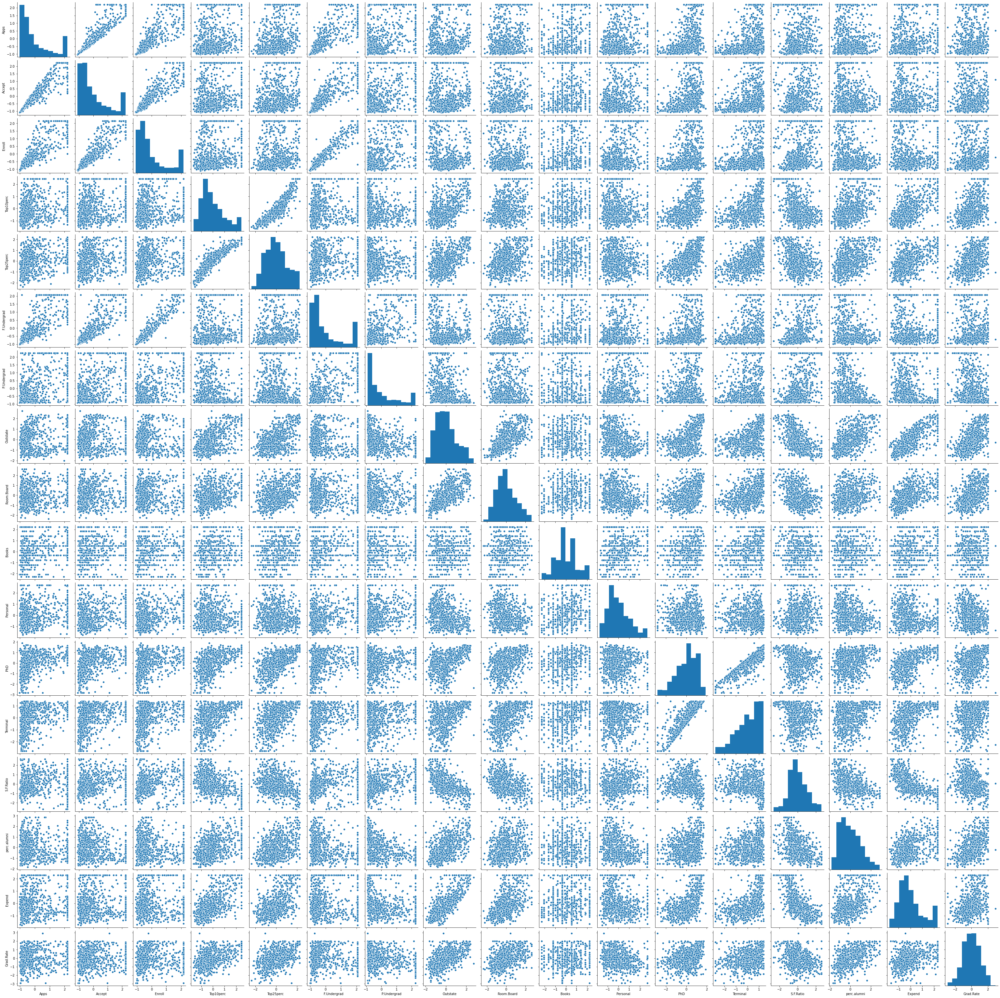

In [53]:
def hide_current_axis (*args, **kwds):
    plt.gca().set_visible(False)
sns.pairplot(df1)


In [54]:
pca =PCA(n_components= 17)
pca.fit_transform(df1)

array([[-1.60249937e+00,  9.93683013e-01,  3.00447636e-02, ...,
         3.09482851e-03, -3.06898585e-02, -1.47130758e-01],
       [-1.80467545e+00, -7.04149922e-02,  2.12212752e+00, ...,
        -3.24329699e-01, -1.63392355e-01,  1.92958540e-01],
       [-1.60828257e+00, -1.38279212e+00, -5.01512552e-01, ...,
         7.30303781e-02, -2.36336429e-02,  4.32362016e-03],
       ...,
       [-5.76882673e-01,  1.77984611e-02,  3.22160336e-01, ...,
        -1.62407776e-01, -2.70575811e-01,  3.87433636e-02],
       [ 6.57095200e+00, -1.18493014e+00,  1.32596561e+00, ...,
        -9.64378943e-02,  9.57356063e-01, -4.55356845e-01],
       [-4.77393067e-01,  1.04394672e+00, -1.42543835e+00, ...,
        -5.59570376e-03, -6.78126913e-02, -4.89303358e-02]])

In [55]:
pca_components = pca.fit_transform(df1)

In [56]:
pca_components

array([[-1.60249937e+00,  9.93683013e-01,  3.00447636e-02, ...,
         3.09482851e-03, -3.06898585e-02, -1.47130758e-01],
       [-1.80467545e+00, -7.04149922e-02,  2.12212752e+00, ...,
        -3.24329699e-01, -1.63392355e-01,  1.92958540e-01],
       [-1.60828257e+00, -1.38279212e+00, -5.01512552e-01, ...,
         7.30303781e-02, -2.36336429e-02,  4.32362016e-03],
       ...,
       [-5.76882673e-01,  1.77984611e-02,  3.22160336e-01, ...,
        -1.62407776e-01, -2.70575811e-01,  3.87433636e-02],
       [ 6.57095200e+00, -1.18493014e+00,  1.32596561e+00, ...,
        -9.64378943e-02,  9.57356063e-01, -4.55356845e-01],
       [-4.77393067e-01,  1.04394672e+00, -1.42543835e+00, ...,
        -5.59570376e-03, -6.78126913e-02, -4.89303358e-02]])

In [57]:
pcdataframe= pd.DataFrame(data= pca_components, columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10','PC11','PC12','PC13','PC14','PC15','PC16','PC17'])

In [58]:
pcdataframe.head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17
0,-1.602499,0.993683,0.030045,-1.008422,-0.366886,-0.697476,0.710616,0.895167,-0.455352,-0.323644,0.306435,0.191806,0.194359,0.074920,0.003095,-0.030690,-0.147131
1,-1.804675,-0.070415,2.122128,3.138941,2.453212,0.994859,-0.396083,0.259664,1.126571,-0.497736,0.172817,0.257233,-0.164074,0.189464,-0.324330,-0.163392,0.192959
2,-1.608283,-1.382792,-0.501513,-0.036373,0.765997,-1.026237,-0.165311,-0.408818,0.273071,-0.690840,0.074447,-0.216534,0.173713,-0.151949,0.073030,-0.023634,0.004324
3,2.803644,-3.367395,0.367768,-0.632914,-1.192601,-1.457080,-1.199862,0.357938,0.706914,-0.085554,-0.430761,0.822403,0.078786,-0.048176,-0.143939,-0.171666,0.062392
4,-2.200868,-0.099348,3.122523,0.657707,-1.828044,0.140915,-1.963228,-0.151893,0.157205,-0.025516,0.195129,0.163324,-0.649347,-0.266673,0.270245,-0.049120,-0.097715
5,-0.730164,-1.998741,0.237171,-0.312879,0.062740,-0.821044,-1.783048,0.211974,-0.699555,0.314872,0.575293,-0.688199,-0.133852,0.164596,-0.195572,0.068272,0.052500
6,0.004516,-1.884603,0.237183,0.857612,-1.878438,-0.132645,0.917462,0.216293,-0.169651,-0.109790,-0.547227,-0.403012,-0.273362,0.200029,0.065322,0.043238,-0.023760
7,1.836067,-1.733341,-0.995891,-0.521397,-0.996701,-0.117335,0.194367,-0.273877,-0.038243,-0.453597,-0.059111,-0.036702,0.248377,-0.078839,-0.026632,-0.239988,0.028376
8,0.619231,-2.459100,-1.823771,0.329401,-0.341261,-0.977575,-0.335224,0.443620,-0.403600,0.400369,0.660810,-0.144574,0.013972,0.078199,0.229210,0.013008,0.038110
9,-2.934353,-1.106131,2.142631,0.235399,1.926359,-0.320840,-0.519369,-0.032652,-0.185995,-0.310129,0.596069,-0.045410,-0.419585,0.105052,0.066666,0.022364,0.077513


In [59]:
pcdataframe.describe().T

,count,mean,std,min,25%,50%,75%,max
PC1,777.0,-2.214016e-16,2.379605,-5.399500,-1.868854,-0.220689,1.505801,6.995931
PC2,777.0,-4.429461e-17,2.212399,-3.959368,-1.555755,-0.629532,1.133577,5.702283
PC3,777.0,-9.716238e-18,1.061305,-3.471188,-0.742408,-0.023188,0.608709,3.886626
PC4,777.0,-1.428858e-18,1.001986,-2.884847,-0.633392,-0.041615,0.572933,4.051176
PC5,777.0,-2.529079e-17,0.933908,-2.863534,-0.618514,-0.013652,0.590963,3.864122
PC6,777.0,-6.286977e-18,0.875074,-2.722917,-0.547608,-0.009044,0.559783,2.967671
PC7,777.0,-1.428858e-17,0.764797,-2.177843,-0.479525,-0.000094,0.537821,3.324086
PC8,777.0,3.715032e-18,0.737906,-2.270946,-0.479366,-0.002041,0.445362,2.645607
PC9,777.0,5.486816e-17,0.650787,-1.907527,-0.451776,-0.012889,0.421573,2.399054
PC10,777.0,2.943448e-17,0.617266,-1.836091,-0.389451,-0.055545,0.366348,2.207317


##### <u> 2.6 Extract the eigenvalues, and eigenvectors.

In [60]:
# cov_matrix on the scaled data
cov_matrix

,Apps,Accept,Enroll,Top10perc,Top25perc,F.Undergrad,P.Undergrad,Outstate,Room.Board,Books,Personal,PhD,Terminal,S.F.Ratio,perc.alumni,Expend,Grad.Rate
Apps,1.00,0.96,0.90,0.32,0.36,0.86,0.52,0.07,0.19,0.24,0.23,0.46,0.44,0.13,-0.10,0.24,0.15
Accept,0.96,1.00,0.94,0.22,0.27,0.90,0.57,-0.01,0.12,0.21,0.26,0.43,0.40,0.19,-0.17,0.16,0.08
Enroll,0.90,0.94,1.00,0.17,0.23,0.97,0.64,-0.16,-0.02,0.20,0.34,0.38,0.35,0.27,-0.22,0.05,-0.02
Top10perc,0.32,0.22,0.17,1.00,0.92,0.11,-0.18,0.56,0.36,0.15,-0.12,0.54,0.51,-0.39,0.46,0.66,0.49
Top25perc,0.36,0.27,0.23,0.92,1.00,0.18,-0.10,0.49,0.33,0.17,-0.09,0.55,0.53,-0.30,0.42,0.57,0.48
F.Undergrad,0.86,0.90,0.97,0.11,0.18,1.00,0.70,-0.23,-0.05,0.21,0.36,0.36,0.34,0.32,-0.29,0.00,-0.08
P.Undergrad,0.52,0.57,0.64,-0.18,-0.10,0.70,1.00,-0.35,-0.07,0.12,0.34,0.13,0.12,0.37,-0.42,-0.20,-0.27
Outstate,0.07,-0.01,-0.16,0.56,0.49,-0.23,-0.35,1.00,0.66,0.01,-0.33,0.39,0.41,-0.57,0.57,0.78,0.57
Room.Board,0.19,0.12,-0.02,0.36,0.33,-0.05,-0.07,0.66,1.00,0.11,-0.22,0.34,0.38,-0.38,0.27,0.58,0.43
Books,0.24,0.21,0.20,0.15,0.17,0.21,0.12,0.01,0.11,1.00,0.24,0.14,0.16,-0.01,-0.04,0.15,-0.01


In [61]:
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)

print('\n Eigen Values \n %s',eig_vals)

print('\n')

print ('\n Eigen Vectos \n %s',eig_vecs)


 Eigen Values 
 %s [5.65648759 4.89669329 1.12663668 1.00930582 0.87043087 0.76594892
 0.58317495 0.54201185 0.42552846 0.37874232 0.25072881 0.0183894
 0.03215181 0.06767969 0.09671864 0.1429102  0.1364607 ]



 Eigen Vectos 
 %s [[-2.61401535e-01  3.15260203e-01  8.05134763e-02 -1.05934054e-01
   2.13190275e-01 -1.02189870e-02  1.52121917e-02 -9.61378502e-02
   1.26190514e-01 -1.69968572e-01  5.27039957e-02  1.64643494e-01
  -5.95331105e-01 -1.69359273e-02 -5.52138310e-01 -1.42969802e-01
  -6.96117853e-02]
 [-2.29059588e-01  3.46591122e-01  1.05478957e-01 -1.22318735e-01
   1.85227153e-01  1.42073984e-02 -1.93656938e-03 -1.37263091e-01
   1.53328843e-01 -1.52806067e-01  3.30195658e-02 -3.92914677e-01
   6.66174844e-01 -7.62683207e-02 -2.60837972e-01 -1.28193014e-01
  -1.07496146e-01]
 [-1.88123764e-01  3.83293528e-01  8.75414603e-02 -1.42919863e-02
   1.68290776e-01  6.79937152e-02  1.96906130e-03 -1.46679255e-01
   5.10242289e-02 -6.08911352e-02  6.89529135e-02  7.22271568e-01
   2

##### <u> 2.8 Consider the cumulative values of the eigenvalues. How does it help you to decide on the optimum number of principal components? What do the eigenvectors indicate?

<h6> Cumulative eigen values <h6>

In [66]:
total= sum(eig_vals)
var_exp = [(i/total) * 100 for i in sorted (eig_vals, reverse= True)]
cum_var_exp = np.cumsum(var_exp)
print ('Cumulative Variance Explained', cum_var_exp)

Cumulative Variance Explained [ 33.27345642  62.07753462  68.7048092   74.64190226  79.76208386
  84.26766574  87.69810662  90.88641165  93.38952021  95.61741621
  97.0922916   97.93293981  98.73564979  99.30458296  99.70269879
  99.89182708 100.        ]


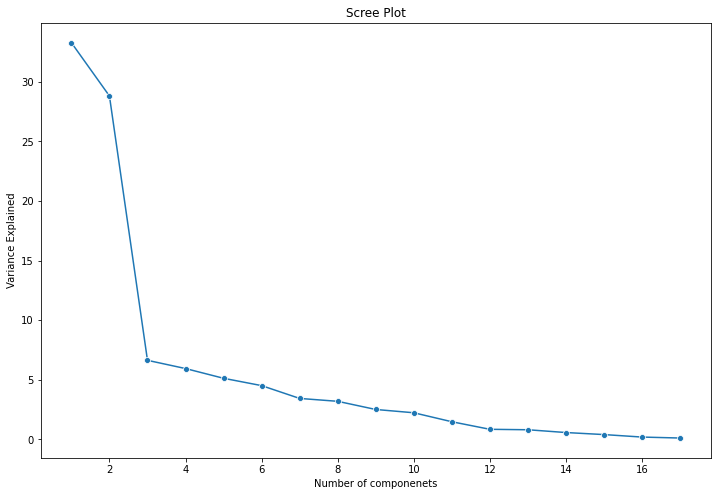

In [73]:
plt.figure(figsize=(12,8))
sns.lineplot(y=var_exp, x= range(1,len(var_exp)+1),marker='o')
plt.xlabel('Number of componenets')
plt.ylabel('Variance Explained')
plt.title('Scree Plot')
plt.show()

<h7> <u> eigen values <h7>
    
- The eigen values helps us to prioritize the PCs as they provide the replative correlation through a number 
- Since the principal component is a orthogonal relation between the eigen values and eigen vectors, eigen value provides the direction to the component.
- There are multiple rules to decide a identify the optimum number of principal components
     1. Pareto analysis 80- 20 rule
     2. Scree Plots


<h7> <u> eigen vectors <h>
    
- eigen vectors are the weights that are attached to the eigen values.
- the multiple dimensions which adjoin with the eigen values to create a eigen vector


##### 2.9  Explain the business implication of using the Principal Component Analysis for this case study. How may PCs help in the further analysis? [Hint: Write Interpretations of the Principal Components Obtained]